### Inspect Data

this file inspects the original data as well as the features extracted by RESNET from CIFAR10 and FMNIST

- TSNE on features
- statistics about the features skewness etc

In [1]:
# activate conda env latent OE-AD

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import cifar10,fashion_mnist
import sys
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.preprocessing import MinMaxScaler

print(sys.path)
sys.path.append('/root/LatentOE-AD')

from Additional_Code_BULE.utils.helper_functions  import *

#import TF and get its version.
import tensorflow as tf
tf_version = tf.__version__

# Check if version >=2.0.0 is used
if not tf_version.startswith('2.'):
    print('\033[91m' + 'WARNING: TensorFlow >= 2.0.0 will be needed.\nYour version is {}'.format(tf_version) + '.\033[0m')
else:
    print('\033[92m' + 'OK: TensorFlow >= 2.0.0' + '.\033[0m')


2023-08-20 15:04:17.167278: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-20 15:04:17.237079: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-20 15:04:17.257478: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-08-20 15:04:17.560560: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: li

['/root/LatentOE-AD/Additional_Code_BULE', '/root/LatentOE-AD/Additional_Code_BULE/c', '/root/LatentOE-AD/Additional_Code_BULE/\\\\Users\\\\buehl\\\\git\\\\projects\\\\LatentOE-AD', '/root/anaconda3/envs/AutencoderTF/lib/python39.zip', '/root/anaconda3/envs/AutencoderTF/lib/python3.9', '/root/anaconda3/envs/AutencoderTF/lib/python3.9/lib-dynload', '', '/root/anaconda3/envs/AutencoderTF/lib/python3.9/site-packages']
OK: TensorFlow >= 2.0.0.


# Original images

## Cifar10 original pictures

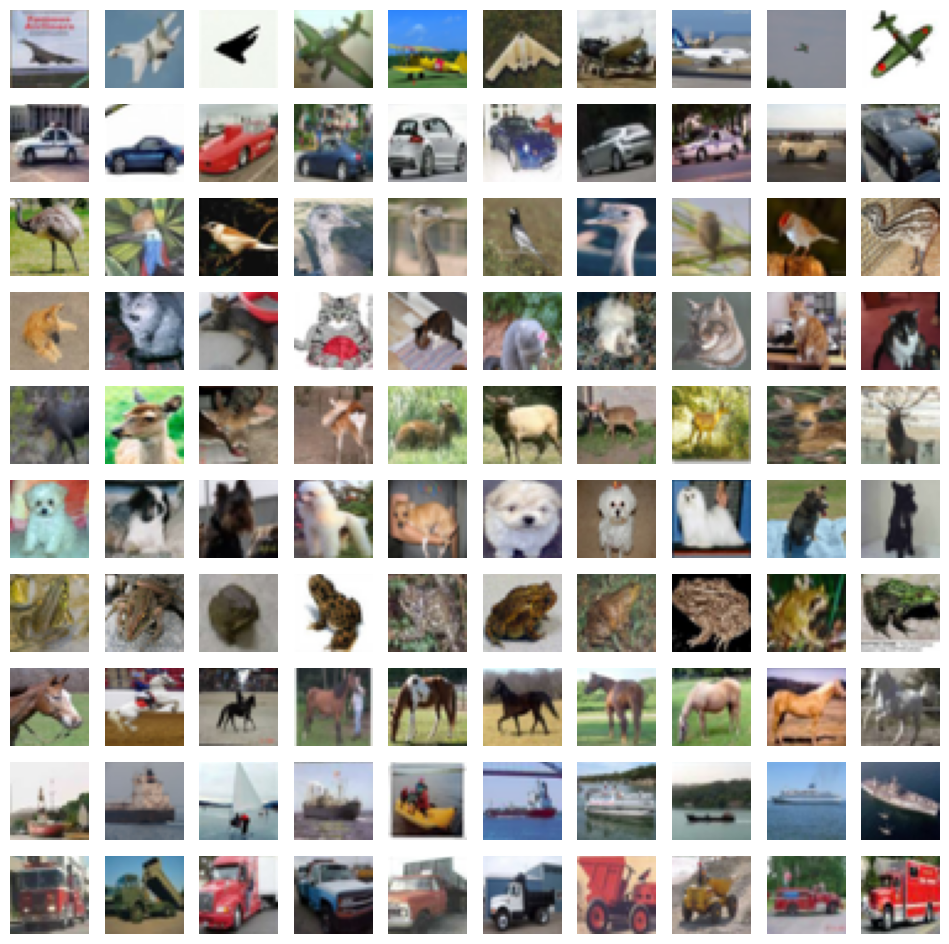

training input shape :  (50000, 32, 32, 3)
training output shape:  (50000, 1)
testing input shape  :  (10000, 32, 32, 3)
testing output shape :  (10000, 1)


In [2]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data() # fucniton from 
show_imgs(X_test, y_test)
print('training input shape : ', X_train.shape)
print('training output shape: ', y_train.shape)
print('testing input shape  : ', X_test.shape)
print('testing output shape : ', y_test.shape)

## FMNIST original pictures (viridis colored)

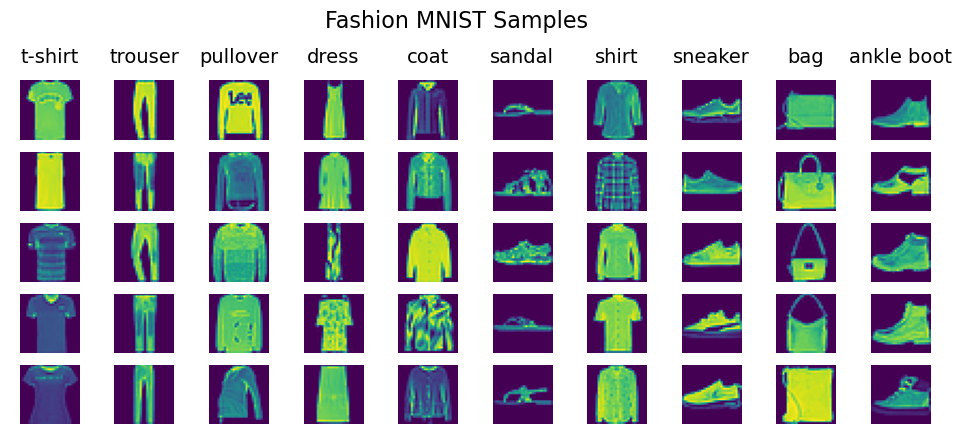

training input shape :  (60000, 28, 28)
training output shape:  (60000,)
testing input shape  :  (10000, 28, 28)
testing output shape :  (10000,)


In [3]:
(X_train, y_train), (X_test, y_test)= fashion_mnist.load_data()

show_imgs_fmnist(X_test, y_test)
print('training input shape : ', X_train.shape)
print('training output shape: ', y_train.shape)
print('testing input shape  : ', X_test.shape)
print('testing output shape : ', y_test.shape)

In [4]:
# TSNE on original images
from sklearn.manifold import TSNE
from tensorflow.keras.datasets import fashion_mnist
(x_train, y_train), (x_test, y_test)= fashion_mnist.load_data()
X = np.zeros((x_train.shape[0], 784))

# flatten the images
for i in range(x_train.shape[0]):
    X[i] = x_train[i].flatten()


# We want to get TSNE embedding with 2 dimensions
n_components = 2
tsne = TSNE(n_components,random_state=12)
tsne_result = tsne.fit_transform(X)
tsne_result.shape

label_names = ["t-shirt","trouser","pullover","dress","coat","sandal","shirt","sneaker","bag","ankle-boot"]
label_dict={i:label_names[i] for i in range(len(label_names))}
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1],'label': y_train})#, 


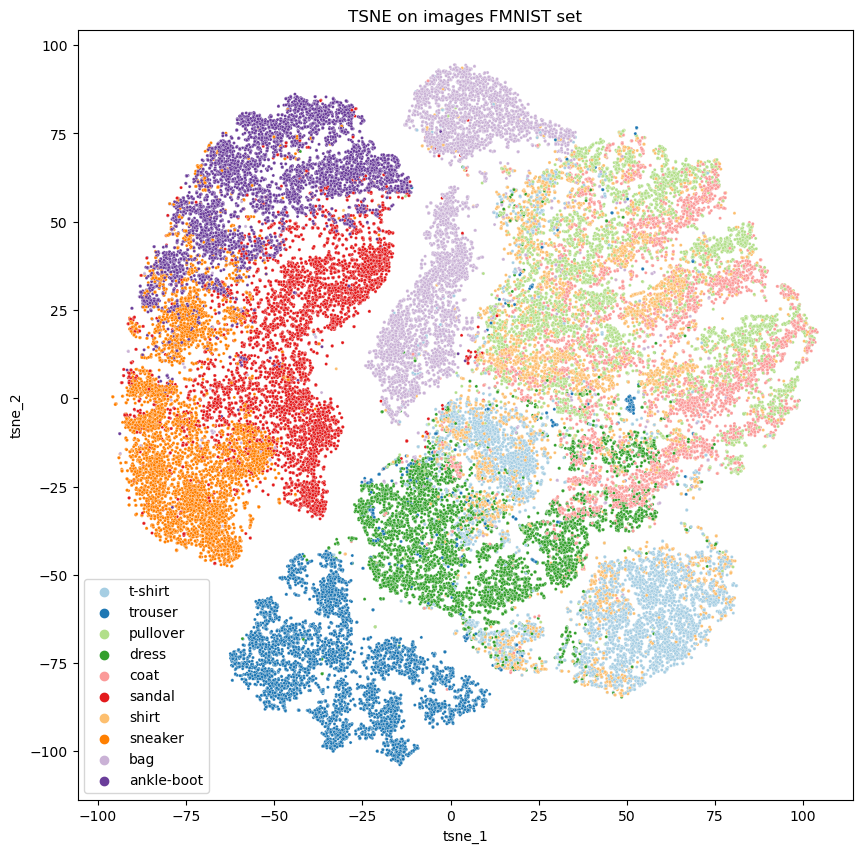

In [5]:
# plot scatter plot of t-SNE results
plot_tsne_scatter(tsne_result_df,label_dict,title=None)

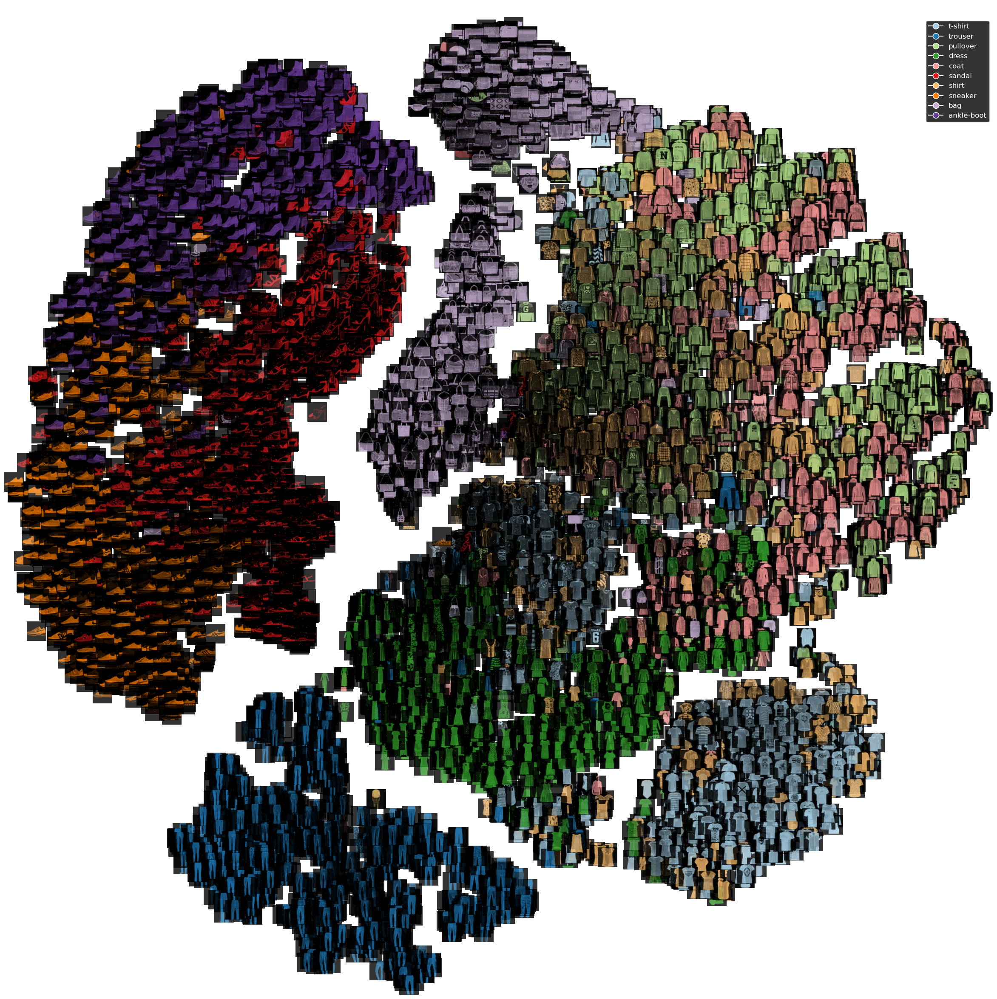

In [6]:
# plot images from the dataset on the t-SNE plot
imsize=2
sample_size = 10000 # 10000 takes ca 3 min

plot_tsne_with_imgs(tsne_result_df, x_train, sample_size=sample_size, imsize=imsize,title=None)

## found an interesting anomaly in the dataset :D

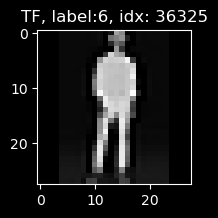

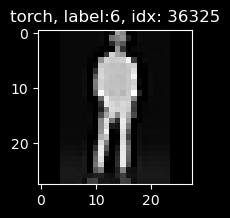

In [7]:
plt.figure(figsize=(2, 2))

# Tensorflow
from tensorflow.keras.datasets import fashion_mnist
import matplotlib.pyplot as plt

(x_train, y_train), _ = fashion_mnist.load_data()
plt.imshow(x_train[36325], cmap='gray') 
plt.title(f'TF, label:{y_train[36325]}, idx: 36325')
plt.show()

plt.figure(figsize=(2, 2))
# Torch
import torch
import torchvision.transforms as transforms
from torchvision.datasets import FashionMNIST

transform = transforms.Compose([transforms.ToTensor()])
dataset = FashionMNIST(root='./data', train=True, download=True, transform=transform)

plt.imshow(dataset[36325][0][0], cmap='gray') 
plt.title(f'torch, label:{dataset[36325][1]}, idx: 36325')
plt.show()


CIFAR10 features

In [8]:
import sys
print(sys.path)
sys.path.append('/root/LatentOE-AD')
from loader.LoadData import CIFAR10_feat , FMNIST_feat

['/root/LatentOE-AD/Additional_Code_BULE', '/root/LatentOE-AD/Additional_Code_BULE/c', '/root/LatentOE-AD/Additional_Code_BULE/\\\\Users\\\\buehl\\\\git\\\\projects\\\\LatentOE-AD', '/root/anaconda3/envs/AutencoderTF/lib/python39.zip', '/root/anaconda3/envs/AutencoderTF/lib/python3.9', '/root/anaconda3/envs/AutencoderTF/lib/python3.9/lib-dynload', '', '/root/anaconda3/envs/AutencoderTF/lib/python3.9/site-packages', '/root/LatentOE-AD']


In [10]:
#laod whole dataset
import torch
root="/root/LatentOE-AD/DATA/cifar10_features/"
trainset = torch.load(root+'trainset_2048.pt')
testset = torch.load(root+'testset_2048.pt')


In [11]:
from sklearn.manifold import TSNE

# We want to get TSNE embedding with 2 dimensions
n_components = 2
tsne = TSNE(n_components)
tsne_result = tsne.fit_transform(trainset[0])
tsne_result.shape



(60000, 2)

In [12]:
n_components = 2
tsne = TSNE(n_components)
tsne_result_test = tsne.fit_transform(testset[0])
tsne_result.shape

(60000, 2)

[Text(0.5, 1.0, 'TSNE CIFAR10 TRAINSET')]

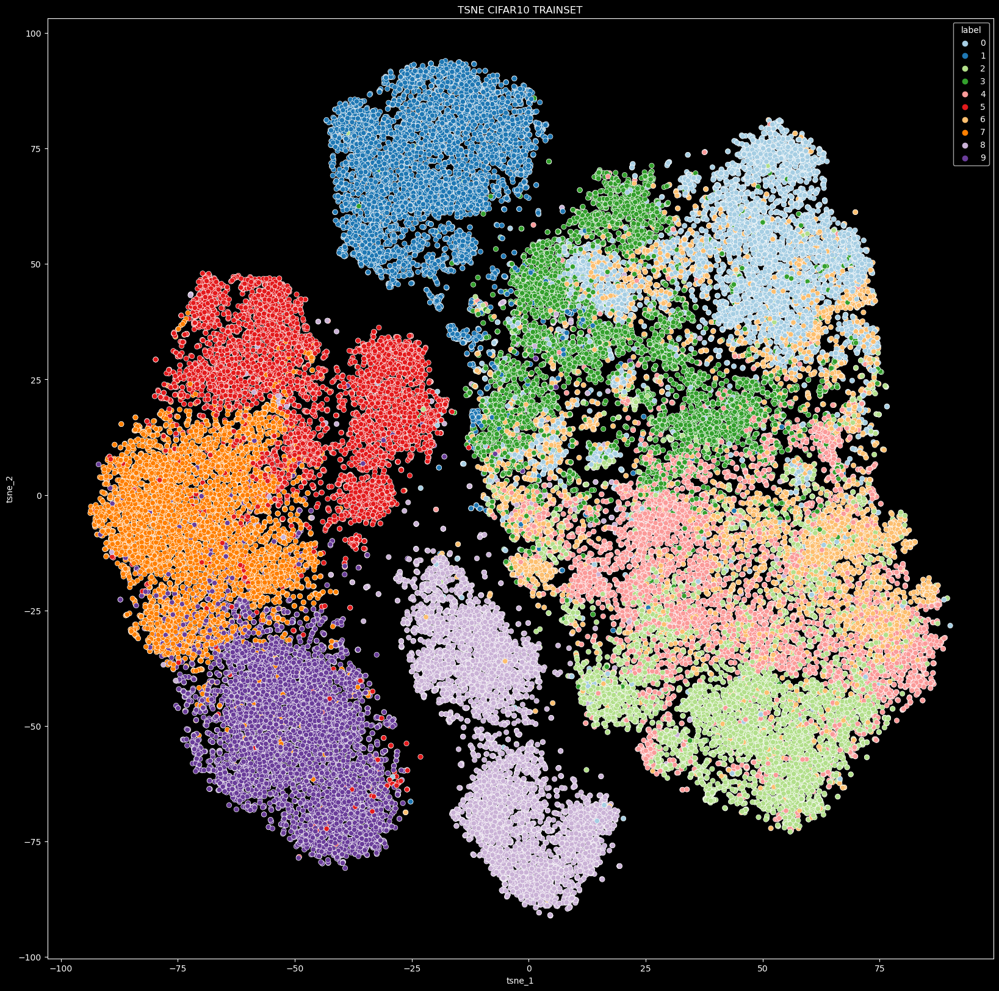

In [13]:
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1],'label': trainset[1]})#, 
plt.rcParams["figure.figsize"] = (20,20)
sns.scatterplot(x='tsne_1', y='tsne_2',data=tsne_result_df,hue='label',palette="Paired").set(title='TSNE CIFAR10 TRAINSET')

[Text(0.5, 1.0, 'TSNE CIFAR10 TESTSET')]

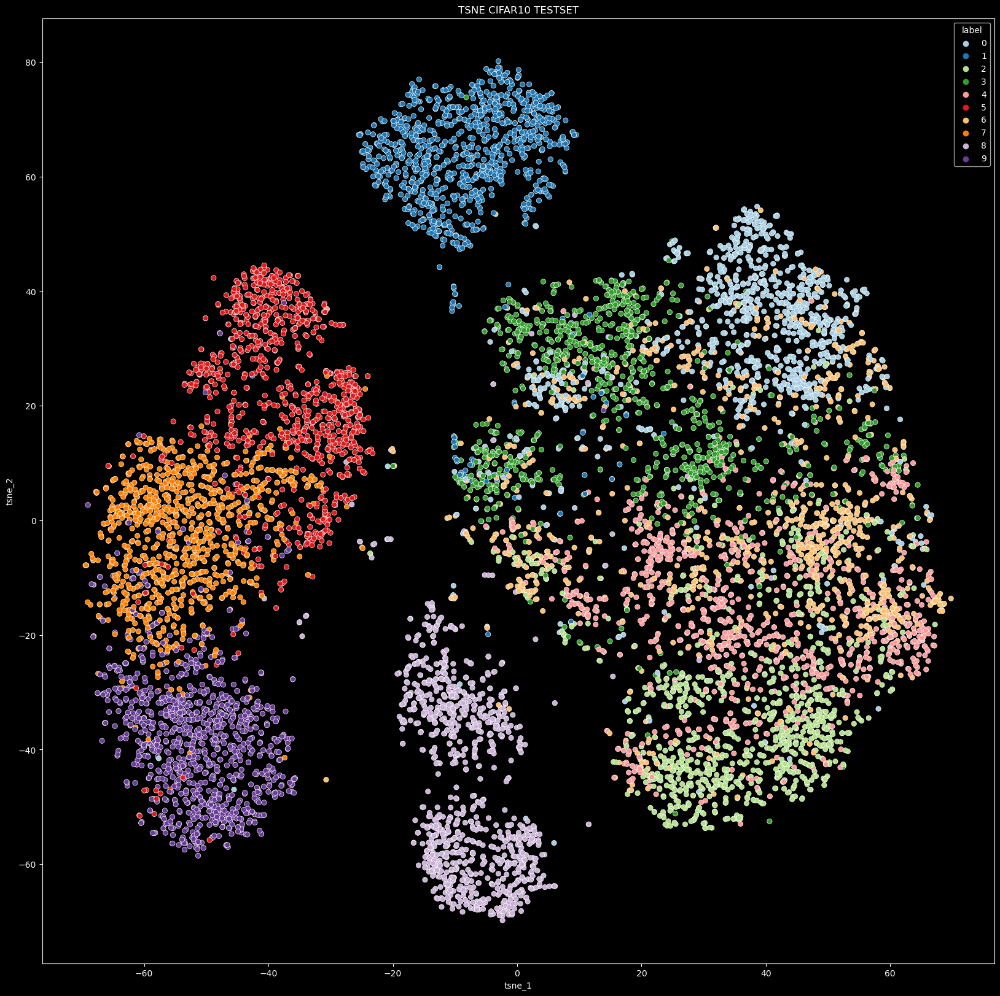

In [14]:
tsne_result_test_df = pd.DataFrame({'tsne_1': tsne_result_test[:,0], 'tsne_2': tsne_result_test[:,1],'label': testset[1]})#, 
plt.rcParams["figure.figsize"] = (20,20)
sns.scatterplot(x='tsne_1', y='tsne_2',data=tsne_result_test_df,hue='label',palette="Paired").set(title='TSNE CIFAR10 TESTSET')

FMNIST features

In [16]:
#laod whole dataset
import torch
from sklearn.manifold import TSNE
root="/root/LatentOE-AD/DATA/fmnist_features/"
trainset = torch.load(root+'trainset_2048.pt')
testset = torch.load(root+'testset_2048.pt')

In [17]:

# On fmnist trainset
n_components = 2
tsne = TSNE(n_components)
tsne_result = tsne.fit_transform(trainset[0])
tsne_result.shape

KeyboardInterrupt: 

In [ ]:
# on fmnist testset
n_components = 2
tsne = TSNE(n_components)
tsne_result_test = tsne.fit_transform(testset[0])

In [ ]:
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1],'label': trainset[1]})#, 
plt.rcParams["figure.figsize"] = (20,20)
sns.scatterplot(x='tsne_1', y='tsne_2',data=tsne_result_df,hue='label',palette="Paired").set(title='TSNE FMNIST TRAINSET')

In [ ]:
tsne_result_test_df = pd.DataFrame({'tsne_1': tsne_result_test[:,0], 'tsne_2': tsne_result_test[:,1],'label': testset[1]})#, 
plt.rcParams["figure.figsize"] = (20,20)
sns.scatterplot(x='tsne_1', y='tsne_2',data=tsne_result_test_df,hue='label',palette="Paired").set(title='TSNE FMNIST TESTSET')

feature statistics fmnist 

In [21]:

from sklearn.preprocessing import normalize, MinMaxScaler
import numpy as np

In [19]:
#pytorch
x_train, y_train, x_test, y_test = FMNIST_feat(0,root="/root/LatentOE-AD/DATA/fmnist_features/"  ,contamination_rate=0.2,trainset_name='trainset_2048.pt')
# numpy array
x_train=x_train.numpy()

In [22]:
all_features=np.concatenate((x_train,x_test),axis=0)

0.4237244
0.0
18.296545


[]

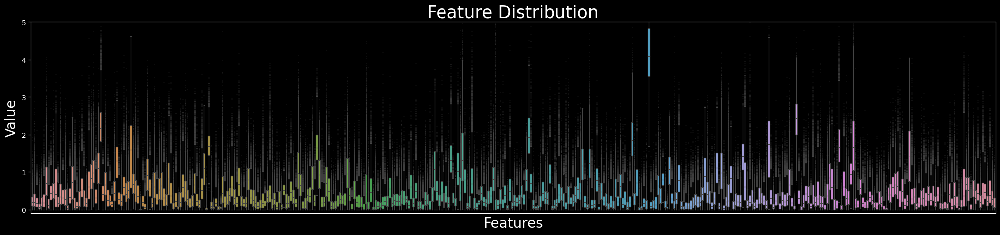

In [23]:
# fetures are not normalized
plt.rcParams["figure.figsize"] = (25,5)
print(np.mean(np.mean(all_features,axis=0)))
print(np.min(np.min(all_features,axis=0)))
print(np.max(np.max(all_features,axis=0)))

sns.boxplot(all_features[:,::5], linewidth=0.9, fliersize=0.05)

ax = plt.gca()
plt.ylim(-0.1, 5)
# Remove the x-axis ticks


# Add a title
plt.title(r"Feature Distribution", fontsize=25)

# Add a ylabel
plt.ylabel("Value", fontsize=20)

# Add an xlabel
plt.xlabel("Features", fontsize=20)



ax.set_xticks([])

0.007476096568372788
0.0
0.2032279005794496
(10000, 2048)


[]

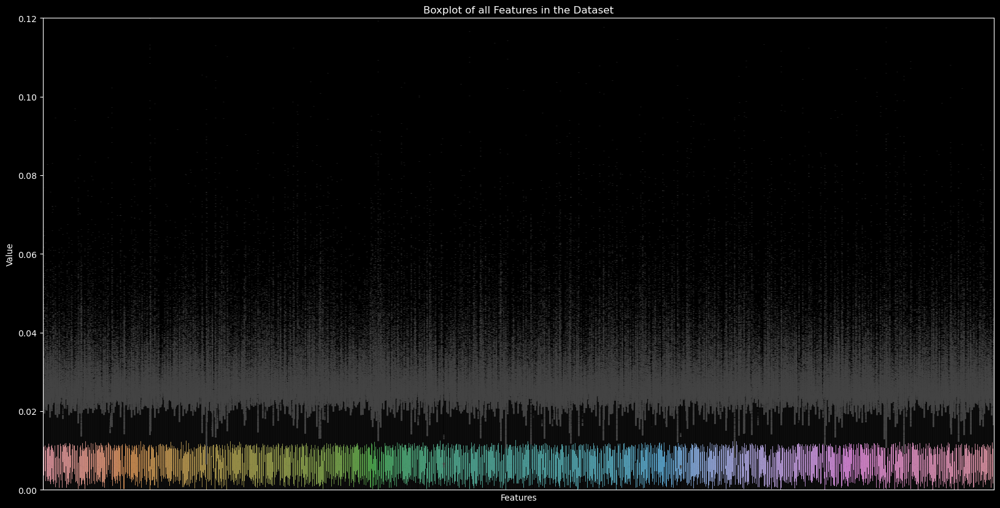

In [26]:

plt.rcParams["figure.figsize"] = (20,10)

x_test_n=normalize(x_test,axis=0)
print(np.mean(np.mean(x_test_n,axis=0)))
print(np.min(np.min(x_test_n,axis=0)))
print(np.max(np.max(x_test_n,axis=0)))
print(x_test_n.shape)
sns.boxplot(x_test_n[:,:], linewidth=0.1, fliersize=0.1)#,0::4
ax = plt.gca()
plt.ylim(0, 0.12)
plt.title("Boxplot of all Features in the Dataset")
plt.ylabel("Value")
plt.xlabel("Features")
ax.set_xticks([])

[0.31834317 0.40700086 0.21939382 ... 0.3151813  0.28615336 0.30847825]
[0. 0. 0. ... 0. 0. 0.]
[1. 1. 1. ... 1. 1. 1.]
(10000, 2048)


<Axes: >

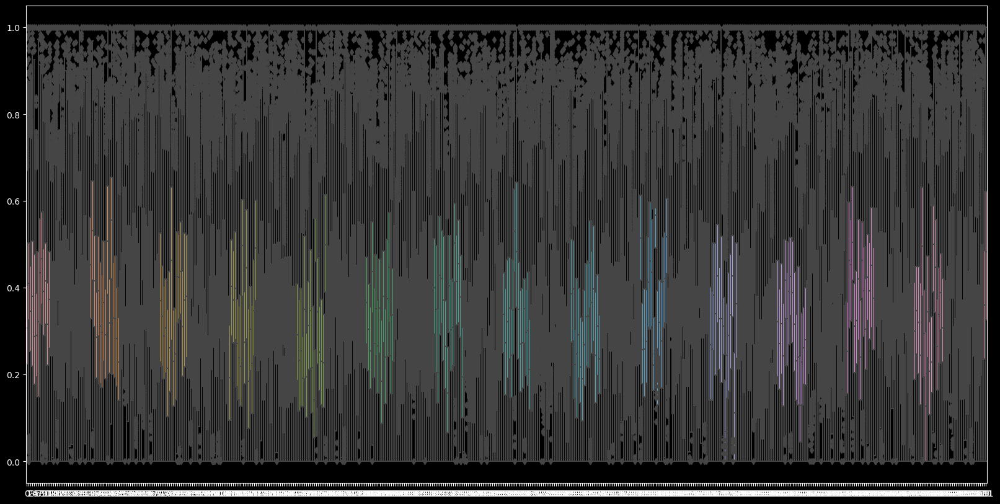

In [27]:
scaler = MinMaxScaler()
scaler.fit(x_test)
x_test_minmax=np.sqrt(scaler.transform(x_test))
print(np.mean(x_test_minmax,axis=0))
print(np.min(x_test_minmax,axis=0))
print(np.max(x_test_minmax,axis=0))
print(x_test_minmax.shape)
sns.boxplot(x_test_minmax[:,0::4])

# Analze data for sensitivy Analysis 
## Trainset

- for different fraction of datapoints show where they lay on the tsne reduction of the features

In [ ]:
### Downsampling of the dataset
root="/root/LatentOE-AD/DATA/fmnist_features/"
#downsample_dataset(root,0.1)

In [ ]:
#laod whole dataset
import torch
from sklearn.manifold import TSNE
import numpy as np
import sys
print(sys.path)
sys.path.append('/root/LatentOE-AD')

from loader.LoadData import CIFAR10_feat , FMNIST_feat
from Extract_img_features import downsample_dataset
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

from Additional_Code_BULE.utils.helper_functions import *

In [ ]:
root="/root/LatentOE-AD/DATA/fmnist_features/"
trainset = torch.load(root+'trainset_2048.pt')
testset = torch.load(root+'testset_2048.pt')


In [ ]:
# TSNE On fmnist trainset  ~ 2mins
n_components = 2
tsne = TSNE(n_components)
tsne_result = tsne.fit_transform(trainset[0])
label_names = ["t-shirt","trouser","pullover","dress","coat","sandal","shirt","sneaker","bag","ankle-boot"]
label_dict={i:label_names[i] for i in range(len(label_names))}

tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1],'label': trainset[1]})#, 
tsne_result_train_df=tsne_result_df

In [ ]:

# plot scatter plot of t-SNE results
plot_tsne_scatter(tsne_result_df,label_dict,title=None)

In [ ]:
from tensorflow.keras.datasets import fashion_mnist
(x_train_orig, y_train), (x_train_orig, y_train)= fashion_mnist.load_data()


# plot images from the dataset on the t-SNE plot
imsize=1.6
sample_size = 60000 # 60000 takes ca 1.5 min
title=f'TSNE on features from ResNet-152 ,FMNIST Trainingset ({sample_size} Samples)'

plot_tsne_with_imgs(tsne_result_df, x_train_orig, sample_size=sample_size, imsize=imsize,title=title, title_fontsize=25, label_fontsize=20) 

### In the Tsne plot we can observe a custer between the trouser and the right big cluster where some persons apper to be in the images

In [ ]:
selected_indexes = tsne_result_df[(tsne_result_df['tsne_1'] >= -13) & (tsne_result_df['tsne_1'] <= -4) & (tsne_result_df['tsne_2'] >= 32) & (tsne_result_df['tsne_2'] <= 42)].index
#hand selected images which are real clothes

print(len(selected_indexes2))
# Tensorflow
from tensorflow.keras.datasets import fashion_mnist
import matplotlib.pyplot as plt

(x_train, y_train), (x_test_orig, y_test) = fashion_mnist.load_data()




num_rows = 4  # Number of rows in the grid
num_cols = 13  # Number of columns in the grid
total_plots = num_rows * num_cols

# Calculate the number of plots to create


label_names = ["t-shirt","trouser","pullover","dress","coat","sandal","shirt","sneaker","bag","ankle-boot"]
sns_palette = sns.color_palette('Paired', n_colors=12)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 15))
fig.subplots_adjust(hspace=-0.5)  # Adjust vertical spacing between subplots ,wspace=-0.8
selected_indexes2=[el for el in selected_indexes if el not in [56374,51476,49387,49894,47312,48119,49109,9933,7723,8219,13686,18092,29066,30964,33001,36445,37154,37497,1890,4850,18007,20716,21393,27260,2,101,801,1071,1167,2124,2874,4274,5912,6077,7865,8900,9016,11838,12393,13598,15027,16154,17081,18477,19390,20135,21381,21838,22081,23092,23416,24464,26385,28857,29847,31925,32198,32297,34314,34401,35699,35776,35971,39880,40269,40754,41104,42362,42587,43816,44103,45971,47772,47804,48453,49029,49879,50892,53513,54027,55108,56014,57392,57476,59007,59298,59682]]
num_plots = min(total_plots, len(selected_indexes2))
for i in range(num_plots):
    row = i // num_cols
    col = i % num_cols
    idx = selected_indexes2[i]

    # Plot the image in the corresponding subplot
    axes[row, col].imshow(apply_color_to_image(x_train[idx], sns_palette[y_train[idx]]), cmap='gray')
    axes[row, col].set_title(f'{label_names[y_train[idx]]}, {idx}')
    axes[row, col].axis('off')  # Turn off axis labels

# In case there are empty subplots, remove them
for i in range(num_plots, total_plots):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

# Add title to the overall figure

plt.style.use('default')#'dark_background'
plt.figtext(0.5, 0.85, 'Selected Images, containing a human', fontsize=24, ha='center')
plt.show()

# plot tsne per class

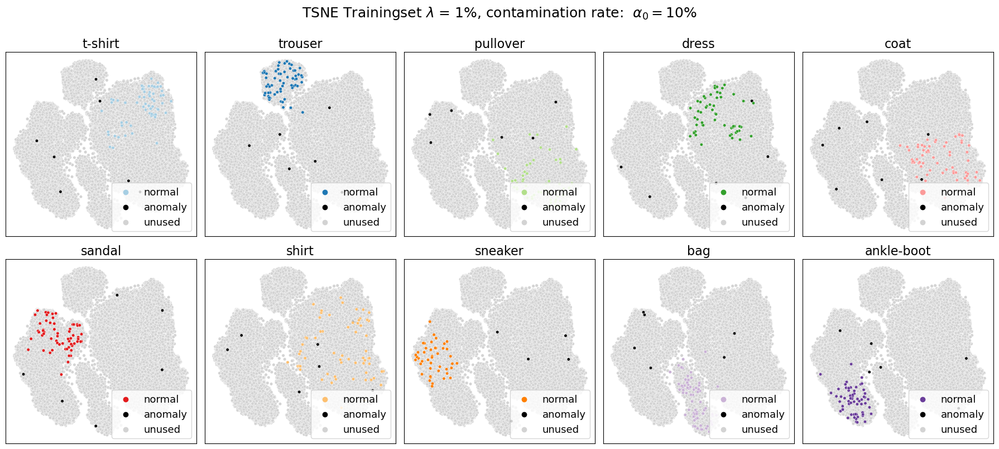

In [50]:

classlist=[0,1,2,3,4,5,6,7,8,9]
fraction=0.01
trainset_name=f'trainset_2048_fraction_{fraction}.pt'

plt.style.use('default')
indexdicts=all_indexdicts(trainset[0],classlist,fraction,trainset_name,contamination_rate=0.1)
plot_all_tsne_per_class(tsne_result, indexdicts)

In [ ]:
classlist=[0,1,2,3,4,5,6,7,8,9]
trainset_name=f'trainset_2048.pt'


indexdicts=all_indexdicts(trainset[0],classlist,fraction,trainset_name,contamination_rate=0.1)
plot_all_tsne_per_class(tsne_result, indexdicts)

## Testset

- for different fraction of datapoints show where they lay on the tsne reduction of the features

In [ ]:
#laod whole dataset
import torch
from sklearn.manifold import TSNE
import numpy as np
import sys
print(sys.path)
sys.path.append('/root/LatentOE-AD')

from loader.LoadData import CIFAR10_feat , FMNIST_feat
from Extract_img_features import downsample_dataset
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

from Additional_Code_BULE.utils.helper_functions import  all_indexdicts, plot_all_tsne_per_class

In [ ]:
root="/root/LatentOE-AD/DATA/fmnist_features/"
testset = torch.load(root+'testset_2048.pt')


In [ ]:
# TSNE On fmnist trainset  ~ 2mins
n_components = 2
tsne = TSNE(n_components)
tsne_result_test = tsne.fit_transform(testset[0])

In [ ]:
label_names = ["t-shirt","trouser","pullover","dress","coat","sandal","shirt","sneaker","bag","ankle-boot"]
label_dict={i:label_names[i] for i in range(len(label_names))}

tsne_result_test_df = pd.DataFrame({'tsne_1': tsne_result_test[:,0], 'tsne_2': tsne_result_test[:,1],'label': testset[1]})#, 
plt.rcParams["figure.figsize"] = (10,10)
ax=sns.scatterplot(x='tsne_1', y='tsne_2',data=tsne_result_test_df,hue='label',palette="Paired",s=5)

# Add title
ax.set_title(f'TSNE on Full FMNIST Testset')

# Change the legend labels
legend_labels = label_dict
handles, _ = ax.get_legend_handles_labels()
ax.legend(handles, [legend_labels[float(label.get_label())] for label in handles])

In [ ]:
classlist=[0,1,2,3,4,5,6,7,8,9]
trainset_name=f'trainset_2048.pt'
fraction=0.01


indexdicts=all_indexdicts(testset[0],classlist,fraction,trainset_name,contamination_rate=0.1,use_test_set=True)
plot_all_tsne_per_class(tsne_result_test, indexdicts,show_testset=True)

train and testset, side by side

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample data for tsne_result_train_df (you should replace this with your actual data)
# tsne_result_train_df = pd.DataFrame({'tsne_1': tsne_result_train[:,0], 'tsne_2': tsne_result_train[:,1],'label': trainset[1]})

label_names = ["t-shirt","trouser","pullover","dress","coat","sandal","shirt","sneaker","bag","ankle-boot"]
label_dict = {i:label_names[i] for i in range(len(label_names))}

plt.rcParams["figure.figsize"] = (20,10)
fig, (ax1, ax2) = plt.subplots(1, 2)

# Scatterplot for Train set
sns.scatterplot(x='tsne_1', y='tsne_2', data=tsne_result_train_df, hue='label', palette="Paired", s=5, ax=ax1,legend=False)
ax1.set_title('Trainset', fontsize=25)
ax1.axis('off')  # Turn off axis

# Scatterplot for Test set
sns.scatterplot(x='tsne_1', y='tsne_2', data=tsne_result_test_df, hue='label', palette="Paired", s=5, ax=ax2,legend=True)
ax2.set_title('Testset', fontsize=25)
ax2.axis('off')  # Turn off axis

# Adjust the legend to appear only once
handles, labels = ax2.get_legend_handles_labels()
new_labels = [label_dict[float(label)] for label in labels[1:]]  # Exclude the 'label' legend entry
ax2.legend(handles[1:], new_labels, loc='center left', bbox_to_anchor=(-0.15, 0.9), fontsize=16)  # Exclude the 'label' legend handle


fig.suptitle("TSNE Scatterplots for FMNIST ", fontsize=30, y=1.03)

plt.tight_layout()
plt.show()
